# 1) Текстовое описание набора данных

### Введение
В качестве набора данных мы будем использовать набор данных датасет "300 world tracks", который содержит информацию о 326 треках от 66 исполнителей в период с 1958 по 2019 год.
Ссылка на датасет: https://www.kaggle.com/datasets/thebumpkin/300-world-music-tracks-with-spotify-data

Использованы аудио-характеристики Spotify для анализа эволюции музыкальных параметров, сравнения различных культур и определения взаимосвязей между популярностью и музыкальными чертами. Исследование включает в себя анализ распределений и корреляций данных. 

Полученные результаты могут быть полезны для музыкантов, исследователей музыкальной культуры и специалистов в области анализа данных.

Датасет хранится в файле WorldHits.csv. Файл содержит следующие колонки:

    Track - Название музыкального трека. (текст)
    Artist - Имя исполнителя или группы. (текст)
    Album - Название альбома. (текст)
    Year - Год выпуска трека. (целое число)
    Duration - Длина трека в миллисекундах. (целое число)
    Time_Signature - Размер такта (beats per measure). (целое число)
    Danceability - Показатель танцевальности (от 0.0 до 1.0). (вещественное число)
    Energy - Показатель энергичности (от 0.0 до 1.0). (вещественное число)
    Key - Музыкальная тональность трека. (целое число)
    Loudness - Громкость трека в децибелах (dB). (вещественное число)
    Mode - Мажорный (1) или минорный (0) лад. (целое число)
    Speechiness - Наличие речи в треке (от 0.0 до 1.0). (вещественное число)
    Acousticness - Показатель акустичности (от 0.0 до 1.0). (вещественное число)
    Instrumentalness - Показатель наличия вокала (от 0.0 до 1.0). (вещественное число)
    Liveness - Показатель живого звучания (от 0.0 до 1.0). (вещественное число)
    Valence - Показатель музыкальной позитивности (от 0.0 до 1.0). (вещественное число)
    Tempo - Темп трека в ударах в минуту (BPM). (вещественное число)
    Popularity - Популярность трека на Spotify (от 0 до 100). (целое число)


### Импорт библиотек
Импортируем библиотеки с помощью команды import. 

In [1]:
%matplotlib notebook

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import statsmodels.stats.multitest

In [3]:
from scipy import stats

### Загрузка и очистка данных
Загрузим файлы датасета в помощью библиотеки Pandas. Проверим данные на предмет присутствия пропусков, выбросов и пр. Также немного преобразуем данные для более эффективного хранения памяти и удобного использования в будущем.


In [4]:
df = pd.read_csv('WorldHits.csv')

In [5]:
# Проверка на пропуски
print("Пропуски до обработки:")
print(df.isna().sum())

Пропуски до обработки:
Track               0
Artist              0
Album               0
Year                0
Duration            0
Time_Signature      0
Danceability        0
Energy              0
Key                 0
Loudness            0
Mode                0
Speechiness         0
Acousticness        0
Instrumentalness    0
Liveness            0
Valence             0
Tempo               0
Popularity          0
dtype: int64


In [6]:
# Преобразование данных
mode_mapping = {0: 'minor', 1: 'major'}
df['Mode'] = df['Mode'].replace(mode_mapping)
df['Mode'] = df['Mode'].astype('category')
df.head(10)

,Track,Artist,Album,Year,Duration,Time_Signature,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Popularity
0,Release,Afro Celt Sound System,Volume 2: Release (Real World Gold),2005,456160,4,0.633,0.828,5,-7.266,minor,0.0480,0.0216,0.055800,0.1080,0.537,100.089,31
1,Saor / Free / News from Nowhere,Afro Celt Sound System,Vol. 1: Sound Magic (Real World Gold),1999,501093,4,0.511,0.524,7,-10.504,major,0.0305,0.0260,0.879000,0.1060,0.118,81.996,24
2,When You're Falling,Afro Celt Sound System,Volume 3 : Further In Time (Real World Gold),2003,314160,4,0.638,0.822,11,-7.305,major,0.0380,0.0508,0.000025,0.0895,0.802,99.010,36
3,Whirl-Y-Reel 1,Afro Celt Sound System,Vol. 1: Sound Magic (Real World Gold),1999,441200,4,0.645,0.810,2,-8.133,major,0.0381,0.1320,0.395000,0.0825,0.530,132.021,25
4,Electric Rendezvous,Al Di Meola,Electric Rendezvous,1982,467266,4,0.337,0.658,9,-12.241,major,0.0388,0.1010,0.748000,0.1130,0.507,108.143,19
5,"Fantasia Suite - Live at Warfield Theatre, San...",Al Di Meola,Friday Night in San Francisco,1981,530506,4,0.341,0.497,9,-13.473,major,0.0344,0.7260,0.537000,0.7630,0.458,100.246,27
6,"Lady of Rome, Sister of Brazil",Al Di Meola,Elegant Gypsy,1980,106240,4,0.710,0.267,9,-16.617,major,0.0435,0.8680,0.706000,0.0676,0.180,110.909,34
7,Mediterranean Sundance / Rio Ancho - Live at W...,Al Di Meola,Friday Night in San Francisco,1981,691306,4,0.415,0.576,4,-11.628,minor,0.0331,0.8340,0.808000,0.6980,0.556,100.540,46
8,Race With Devil On Spanish Highway,Al Di Meola,Elegant Gypsy,1979,378266,4,0.318,0.772,2,-11.606,major,0.0633,0.1390,0.531000,0.2380,0.661,88.648,28
9,The Wizard,Al Di Meola,Land Of The Midnight Sun,1986,406133,4,0.378,0.552,6,-14.155,major,0.0519,0.3690,0.851000,0.2470,0.652,157.859,18


# 2) Основные характеристики датасета.
Посчитаем основные статистики

In [7]:
# Первые 5 строк датасета
df.head()

,Track,Artist,Album,Year,Duration,Time_Signature,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Popularity
0,Release,Afro Celt Sound System,Volume 2: Release (Real World Gold),2005,456160,4,0.633,0.828,5,-7.266,minor,0.0480,0.0216,0.055800,0.1080,0.537,100.089,31
1,Saor / Free / News from Nowhere,Afro Celt Sound System,Vol. 1: Sound Magic (Real World Gold),1999,501093,4,0.511,0.524,7,-10.504,major,0.0305,0.0260,0.879000,0.1060,0.118,81.996,24
2,When You're Falling,Afro Celt Sound System,Volume 3 : Further In Time (Real World Gold),2003,314160,4,0.638,0.822,11,-7.305,major,0.0380,0.0508,0.000025,0.0895,0.802,99.010,36
3,Whirl-Y-Reel 1,Afro Celt Sound System,Vol. 1: Sound Magic (Real World Gold),1999,441200,4,0.645,0.810,2,-8.133,major,0.0381,0.1320,0.395000,0.0825,0.530,132.021,25
4,Electric Rendezvous,Al Di Meola,Electric Rendezvous,1982,467266,4,0.337,0.658,9,-12.241,major,0.0388,0.1010,0.748000,0.1130,0.507,108.143,19


In [8]:
# Размер датасета - 326 строк, 18 колонок
df.shape

(326, 18)

In [9]:
total_count = df.shape[0]
print('Всего строк: {}'.format(total_count))
# Список колонок
# df.columns
# Список колонок с типами данных
df.dtypes

Всего строк: 326


Track                 object
Artist                object
Album                 object
Year                   int64
Duration               int64
Time_Signature         int64
Danceability         float64
Energy               float64
Key                    int64
Loudness             float64
Mode                category
Speechiness          float64
Acousticness         float64
Instrumentalness     float64
Liveness             float64
Valence              float64
Tempo                float64
Popularity             int64
dtype: object

In [10]:
# Основные статистики для категориальных признаков
print(df.select_dtypes('category').describe())

         Mode
count     326
unique      2
top     major
freq      206


In [11]:
# Основные статистики для числовых признаков
print(df.describe())

              Year      Duration  Time_Signature  Danceability      Energy  \
count   326.000000  3.260000e+02      326.000000    326.000000  326.000000   
mean   1992.407975  3.337062e+05        3.889571      0.522381    0.502092   
std      12.680298  2.680486e+05        0.415191      0.170469    0.259283   
min    1958.000000  4.188000e+04        1.000000      0.078800    0.005620   
25%    1985.000000  2.124700e+05        4.000000      0.404250    0.292250   
50%    1995.000000  2.648330e+05        4.000000      0.542000    0.489500   
75%    2002.000000  3.498832e+05        4.000000      0.657750    0.729000   
max    2019.000000  3.060650e+06        5.000000      0.946000    0.985000   

              Key    Loudness  Speechiness  Acousticness  Instrumentalness  \
count  326.000000  326.000000   326.000000    326.000000        326.000000   
mean     5.438650  -11.799755     0.061305      0.519446          0.240264   
std      3.580405    5.159427     0.065734      0.331782       

In [12]:
# Определим уникальные значения для целевого признака
df['Mode'].unique()

['minor', 'major']
Categories (2, object): ['major', 'minor']

Целевой признак является категориальным и содержит только значения "minor" и "major".

# 3) Визуальное исследование датасета

Для визуального исследования могут быть использованы различные виды диаграмм, мы построим только некоторые варианты диаграмм, которые используются достаточно часто.

### Графики рассеяния
Позволяет построить распределение двух колонок данных и визуально обнаружить наличие зависимости. 

Построим графики рассеяния, показывающие, есть ли связь между популярностью и танцевальностью/энергичностью треков. Построим матрицу корреляций, которая количественно оценивает связь между этими признаками.

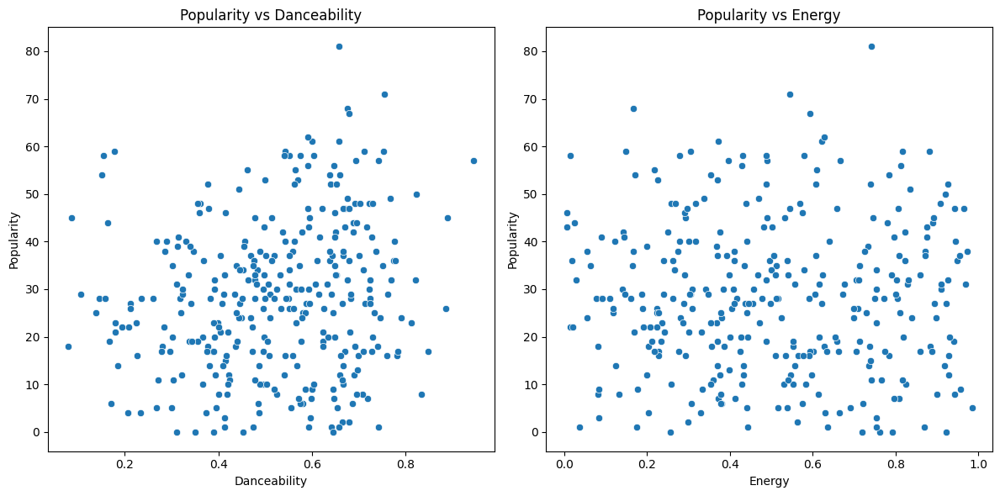

Корреляция между популярностью и танцевальностью/энергичностью:
 Danceability    0.158759
Energy         -0.010802
Name: Popularity, dtype: float64


In [13]:
%matplotlib inline

# Визуализация
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='Danceability', y='Popularity', data=df)
plt.title('Popularity vs Danceability')
plt.subplot(1, 2, 2)
sns.scatterplot(x='Energy', y='Popularity', data=df)
plt.title('Popularity vs Energy')
plt.tight_layout()
plt.show()

# Анализ корреляции
corr_dance_energy_pop = df[['Popularity', 'Danceability', 'Energy']].corr(numeric_only=True)
print("Корреляция между популярностью и танцевальностью/энергичностью:\n", corr_dance_energy_pop['Popularity'].drop('Popularity'))

### Гистограмма
Позволяет оценить плотность вероятности распределения данных.

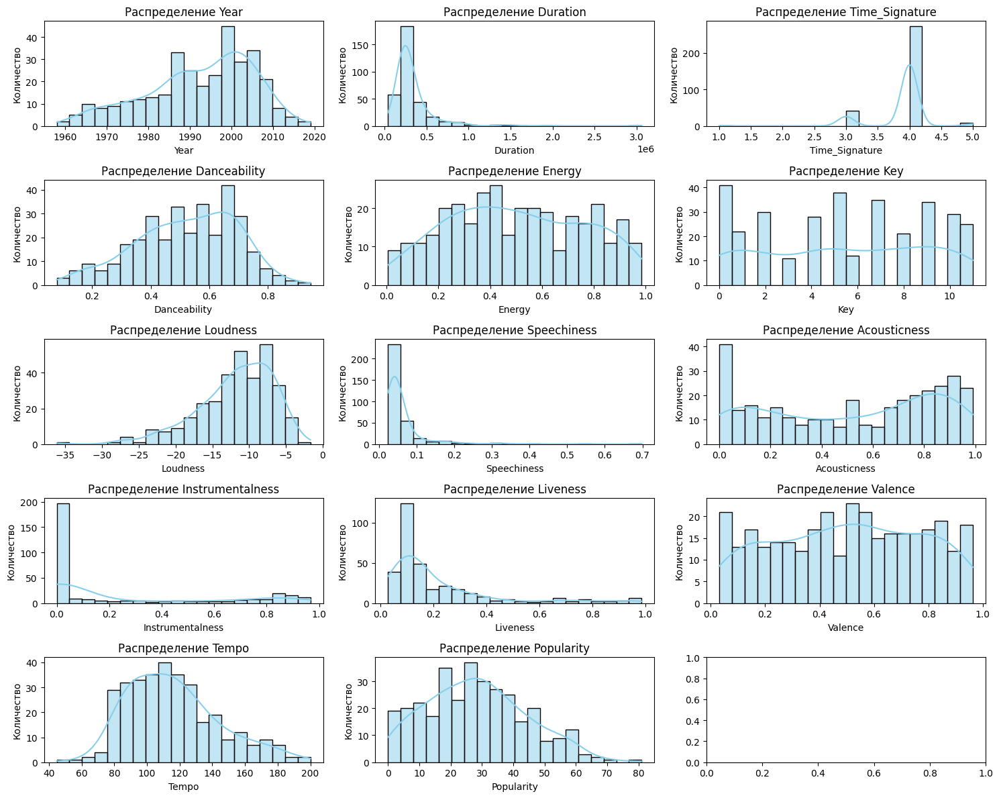

In [14]:
# Распределение числовых признаков
num_cols = df.select_dtypes(include=['float64', 'int64']).columns
fig, axes = plt.subplots(len(num_cols) // 3 + (len(num_cols) % 3 > 0), 3, figsize=(15, 12))
axes = axes.flatten()

for ax, col in zip(axes, num_cols):
    sns.histplot(df[col], ax=ax, kde=True, bins=20, color='skyblue')
    ax.set_title(f'Распределение {col}')
    ax.set_ylabel('Количество')

plt.tight_layout()
plt.show()

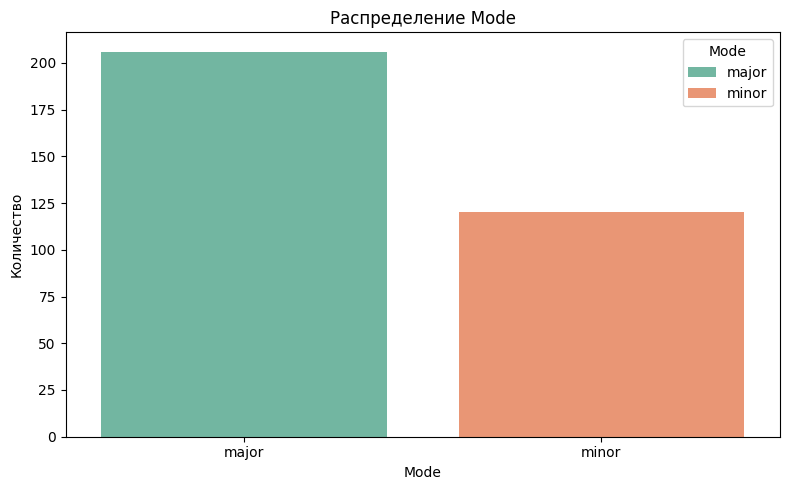

In [15]:
# Распределение категориальных признаков
cat_cols = df.select_dtypes(include=['category']).columns
fig, axes = plt.subplots(len(cat_cols), 1, figsize=(8, 5 * len(cat_cols)))
if hasattr(axes, 'flatten'):
    axes = axes.flatten()
else:
   axes = [axes]

for ax, col in zip(axes, cat_cols):
    sns.countplot(x=df[col], ax=ax, palette='Set2', hue=df[col], legend=True)
    ax.set_title(f'Распределение {col}')
    ax.set_ylabel('Количество')

plt.tight_layout()
plt.show()

### Jointplot
Комбинация гистограмм и диаграмм рассеивания. Диаграмма показывает совместное распределение популярности и громкости треков Spotify с помощью KDE, визуализируя плотность их комбинаций и одномерные распределения каждого признака. Анализ контуров и пиков позволяет оценить наличие и характер взаимосвязи между популярностью и громкостью треков.

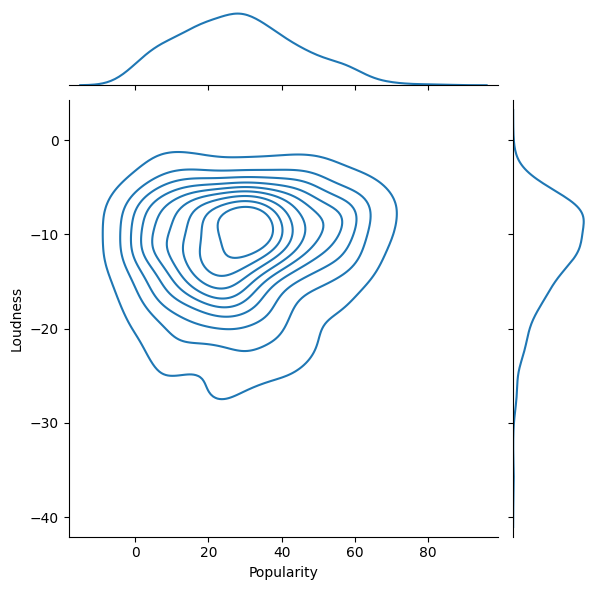

In [16]:
sns.jointplot(x='Popularity', y='Loudness', data=df, kind = 'kde')

### Парные диаграммы
Комбинация гистограмм и диаграмм рассеивания для всего набора данных.

Выводится матрица графиков. На пересечении строки и столбца, которые соответстуют двум показателям, строится диаграмма рассеивания. 
В главной диагонали матрицы строятся гистограммы распределения соответствующих показателей.

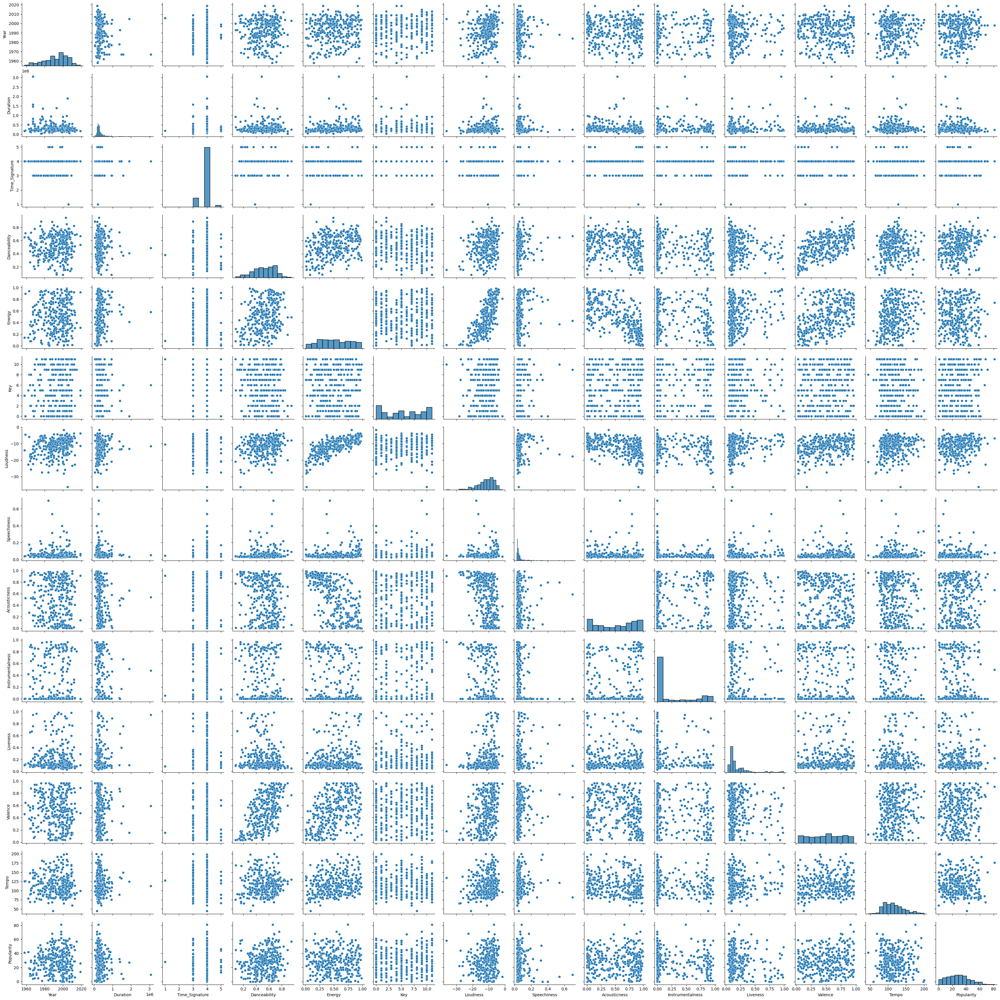

In [17]:
sns.pairplot(df)

С помощью параметра "hue" возможна группировка по значениям какого-либо признака.

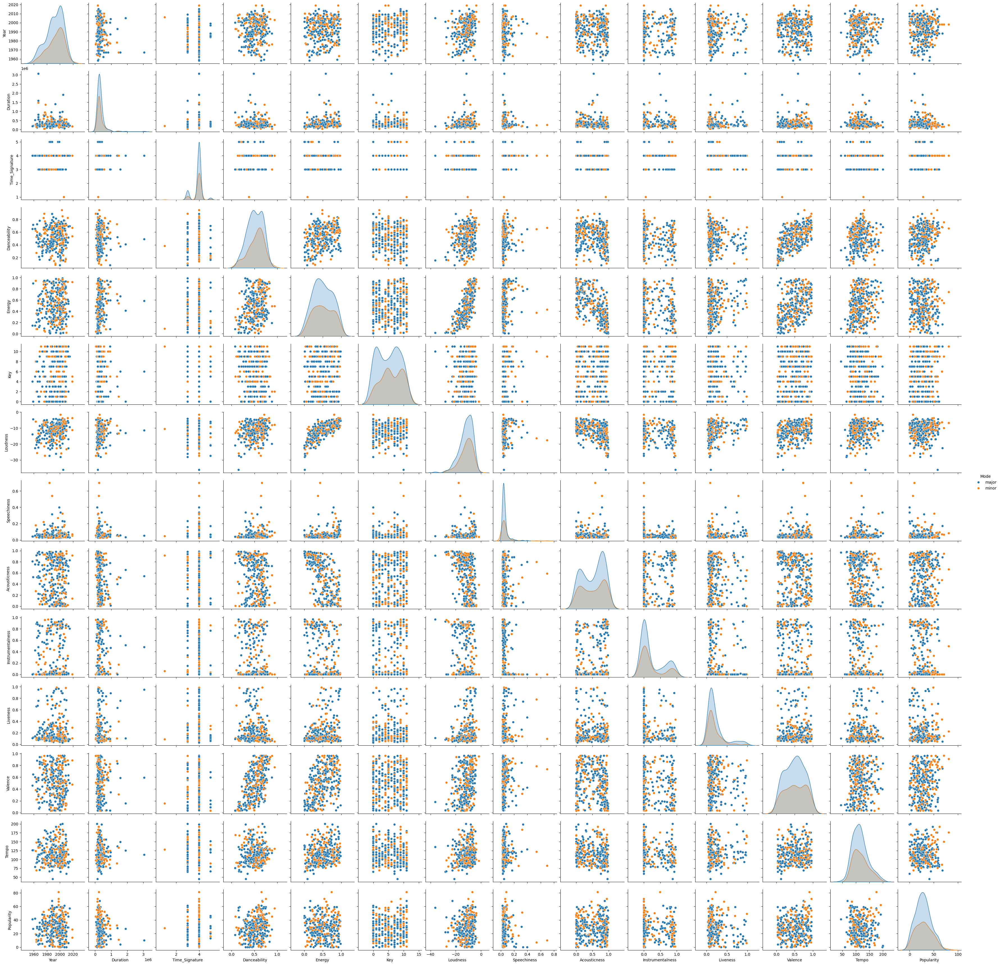

In [18]:
sns.pairplot(df, hue="Mode")

### Ящик с усами
Для непрерывных переменных можно использовать boxplot для идентификации выбросов. Ящик с усами (Boxplot) показывает распределение данных по квартилям, медиане, а также выявляет выбросы. Он позволяет быстро оценить центральную тенденцию, разброс и симметричность данных.

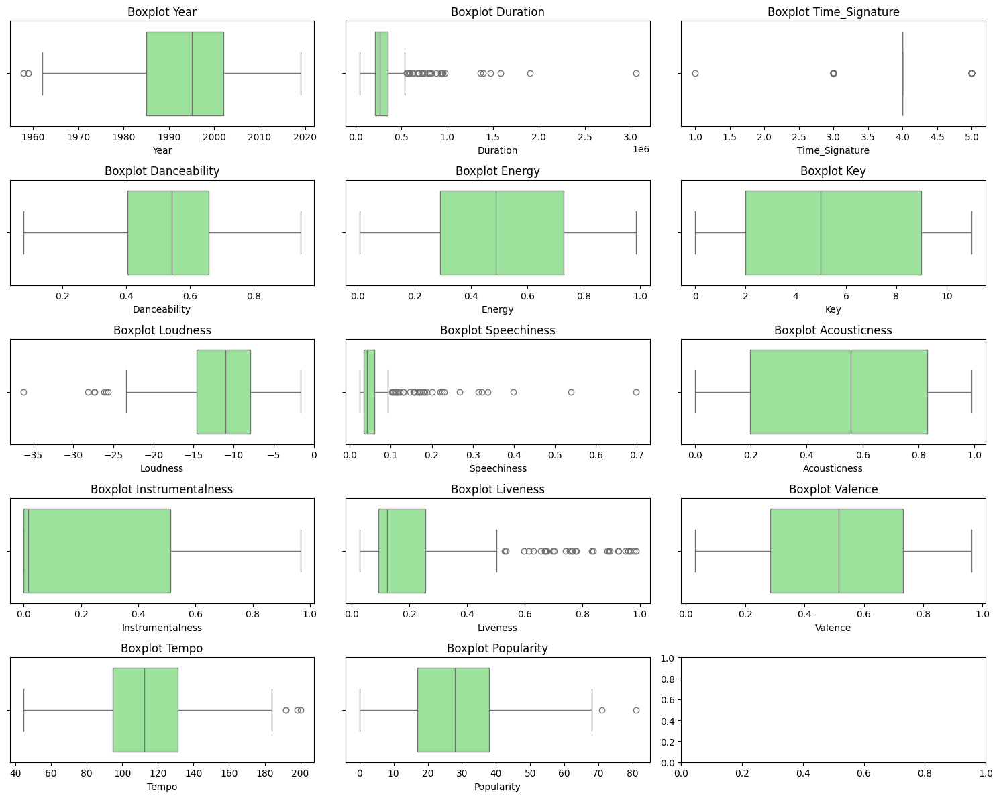

In [19]:
# Boxplot для числовых признаков
fig, axes = plt.subplots(len(num_cols) // 3 + (len(num_cols) % 3 > 0), 3, figsize=(15, 12))
axes = axes.flatten()

for ax, col in zip(axes, num_cols):
    sns.boxplot(x=df[col], ax=ax, color='lightgreen')
    ax.set_title(f'Boxplot {col}')

plt.tight_layout()
plt.show()

### Violin plot
Для непрерывных переменных можно использовать violinplot для демонстрации плотности вероятности. Скрипичный график сочетает в себе ящик с усами и оценку плотности ядра (KDE), демонстрируя как квартили и выбросы, так и форму распределения данных. Он наглядно показывает концентрацию значений и позволяет сравнивать распределения разных групп.

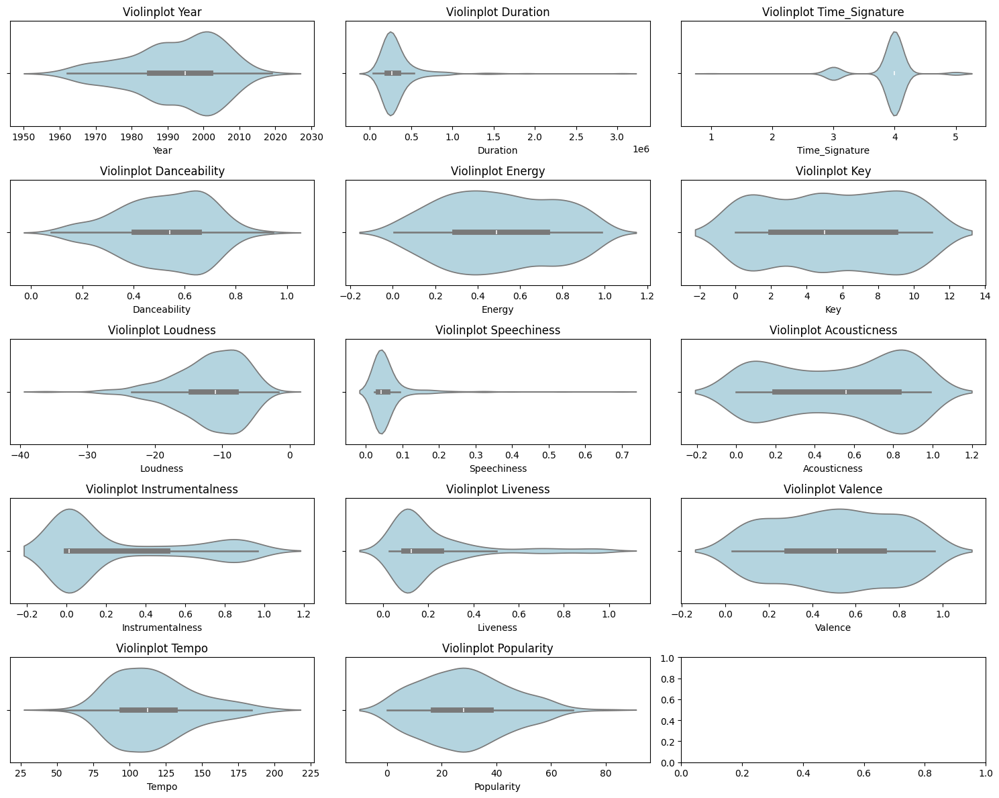

In [20]:
# Violinplot для числовых признаков
fig, axes = plt.subplots(len(num_cols) // 3 + (len(num_cols) % 3 > 0), 3, figsize=(15, 12))
axes = axes.flatten()

for ax, col in zip(axes, num_cols):
    sns.violinplot(x=df[col], ax=ax, color='lightblue')
    ax.set_title(f'Violinplot {col}')

plt.tight_layout()
plt.show()

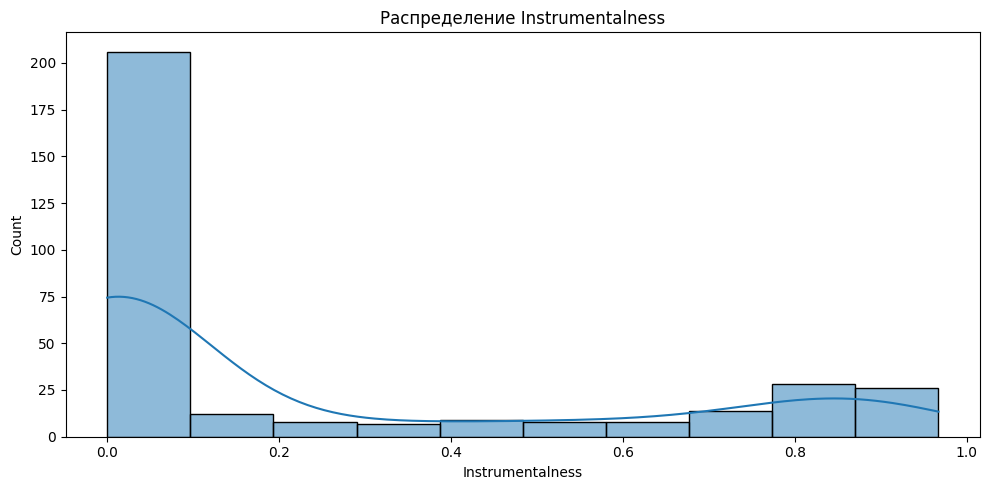

In [21]:
# проверим скрипичную диаграмму для показателя наличия вокала
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title('Распределение Instrumentalness')
sns.histplot(df['Instrumentalness'], kde=True, ax=ax)
plt.tight_layout()
plt.show()

# 4) Информация о корреляции признаков

Проверка корреляции признаков позволяет решить две задачи:
1. Понять какие признаки (колонки датасета) наиболее сильно коррелируют с целевым признаком (в нашем примере это колонка "Mode"). Именно эти признаки будут наиболее информативными для моделей машинного обучения. Признаки, которые слабо коррелируют с целевым признаком, можно попробовать исключить из построения модели, иногда это повышает качество модели. Нужно отметить, что некоторые алгоритмы машинного обучения автоматически определяют ценность того или иного признака для построения модели.
2. Понять какие нецелевые признаки линейно зависимы между собой. Линейно зависимые признаки, как правило, очень плохо влияют на качество моделей. Поэтому если несколько признаков линейно зависимы, то для построения модели из них выбирают какой-то один признак.

In [22]:
numeric_df = df.select_dtypes(include=['number'])  # Выбираем только числовые столбцы
numeric_df.corr()

,Year,Duration,Time_Signature,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Popularity
Year,1.000000,-0.189393,0.015597,0.076979,0.049895,0.033728,0.202742,-0.031360,-0.017693,-0.065800,-0.048412,-0.079828,-0.016918,0.082522
Duration,-0.189393,1.000000,0.002189,-0.038513,0.137261,-0.009721,0.033010,-0.014658,-0.120008,0.138951,0.192034,-0.003672,-0.002062,-0.132669
Time_Signature,0.015597,0.002189,1.000000,0.198352,0.107461,-0.033549,0.028226,0.067406,-0.140952,-0.065136,-0.004951,0.095594,-0.147418,0.015081
Danceability,0.076979,-0.038513,0.198352,1.000000,0.306758,-0.107458,0.239523,0.109498,-0.228475,-0.205886,-0.161245,0.584194,0.014639,0.158759
Energy,0.049895,0.137261,0.107461,0.306758,1.000000,0.008558,0.753119,0.198756,-0.670676,-0.193241,0.231230,0.473642,0.224133,-0.010802
Key,0.033728,-0.009721,-0.033549,-0.107458,0.008558,1.000000,0.028508,0.047261,0.091315,0.086917,0.019283,0.022256,-0.082481,0.058229
Loudness,0.202742,0.033010,0.028226,0.239523,0.753119,0.028508,1.000000,0.027191,-0.460407,-0.338593,0.213055,0.343379,0.171401,0.074378
Speechiness,-0.031360,-0.014658,0.067406,0.109498,0.198756,0.047261,0.027191,1.000000,-0.077038,-0.091874,0.175258,0.126809,0.067646,-0.128745
Acousticness,-0.017693,-0.120008,-0.140952,-0.228475,-0.670676,0.091315,-0.460407,-0.077038,1.000000,0.128933,-0.051832,-0.199018,-0.149082,0.032508
Instrumentalness,-0.065800,0.138951,-0.065136,-0.205886,-0.193241,0.086917,-0.338593,-0.091874,0.128933,1.000000,-0.060330,-0.230340,-0.097257,-0.085406


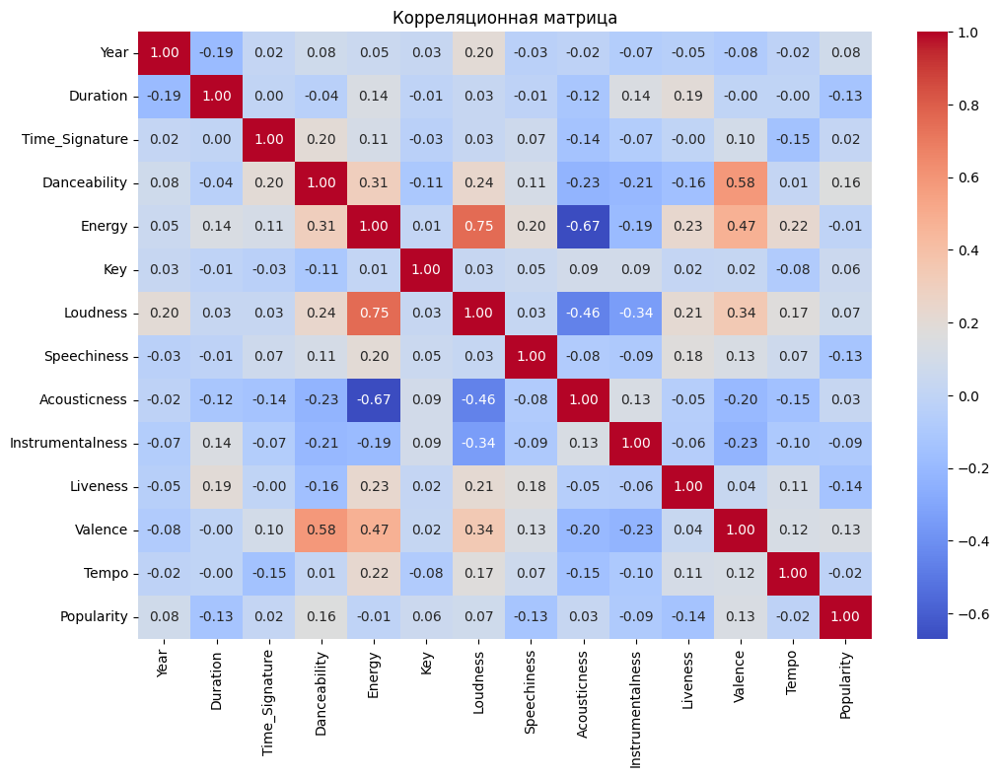

In [23]:
# Построение тепловой карты корреляций между числовыми признаками
%matplotlib inline
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Корреляционная матрица")
plt.show()

Корреляционная матрица содержит коэффициенты корреляции между всеми парами признаков.

Корреляционная матрица симметрична относительно главной диагонали. На главной диагонали расположены единицы (корреляция признака самого с собой).

На основе корреляционной матрицы можно сделать следующие выводы:
Заметим, что есть высокая положительная связь между энергичностью и громкостью трека, высокая отрицательная связь между энергичностью и акустичностью, средняя положительная связь между танцевальностью и позитивности.

По умолчанию при построении матрицы используется коэффициент корреляции Пирсона. Возможно также построить корреляционную матрицу на основе коэффициентов корреляции Кендалла и Спирмена. На практике три метода редко дают значимые различия.

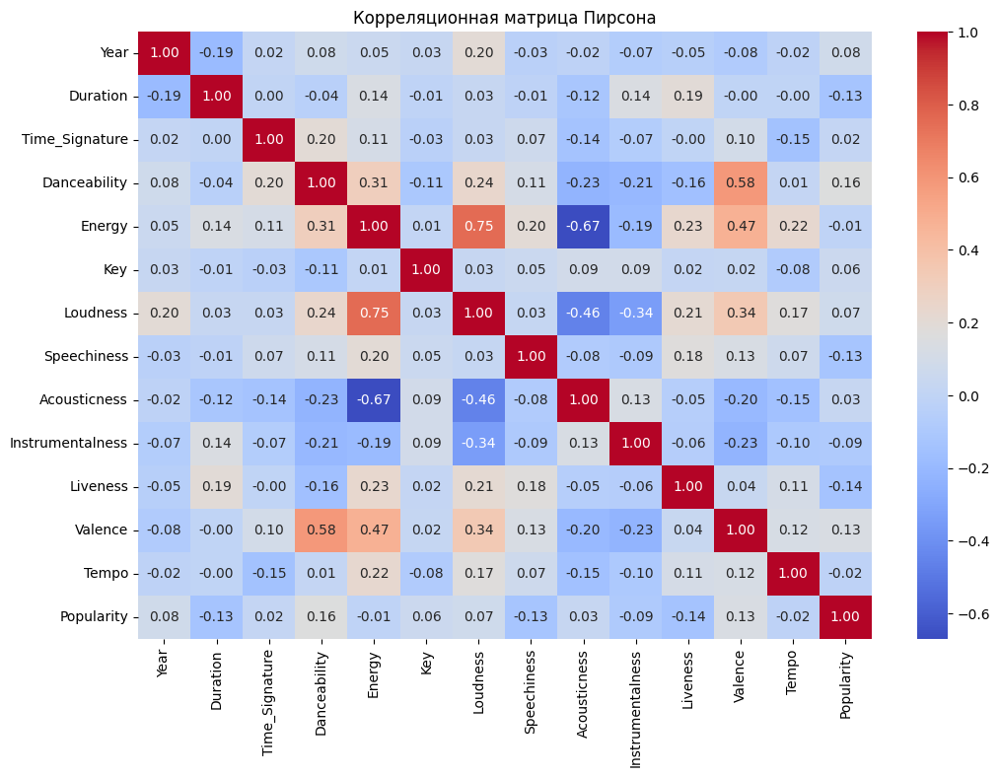

In [24]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True, method='pearson'), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Корреляционная матрица Пирсона")
plt.show()

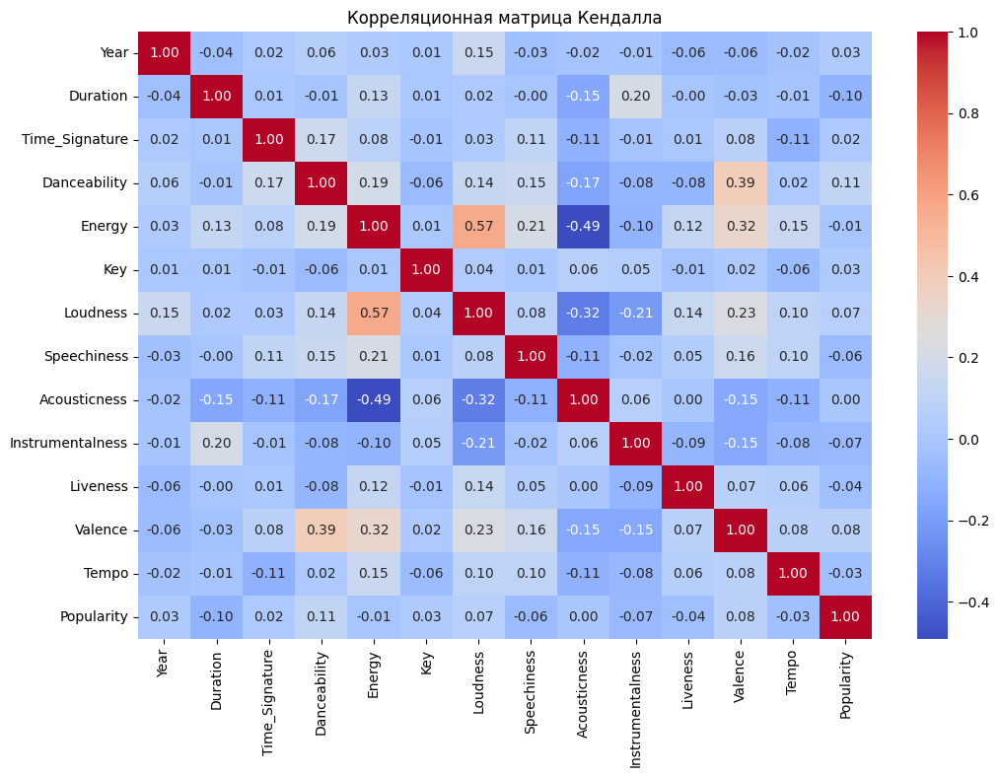

In [25]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True, method='kendall'), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Корреляционная матрица Кендалла")
plt.show()

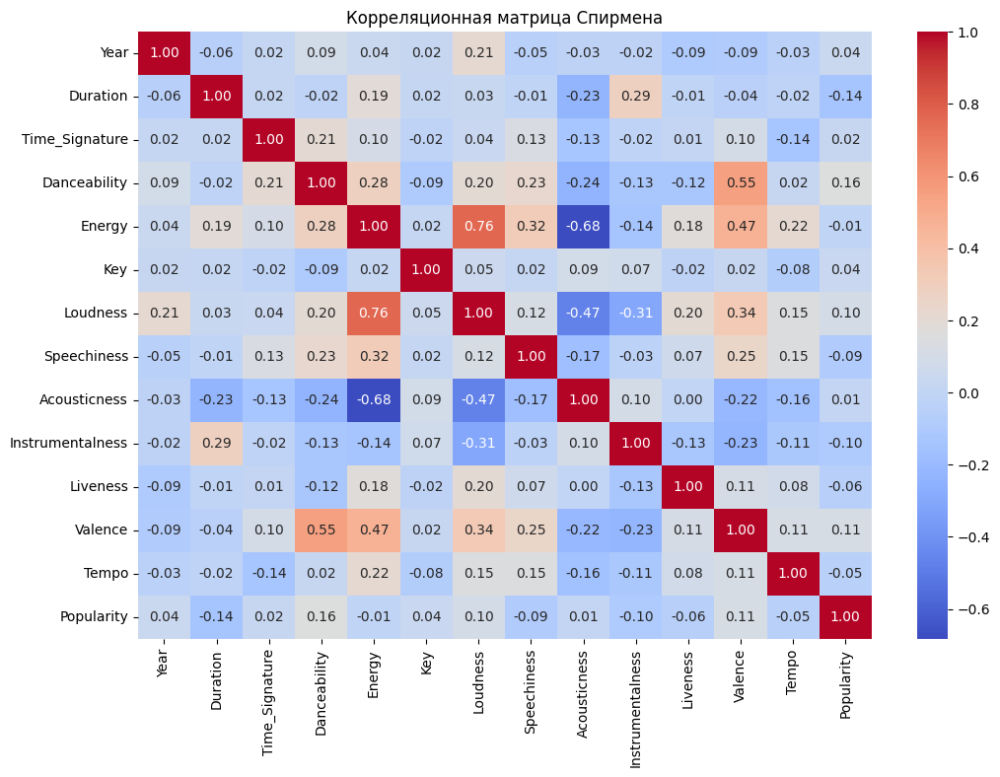

In [26]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True, method='spearman'), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Корреляционная матрица Спирмена")
plt.show()

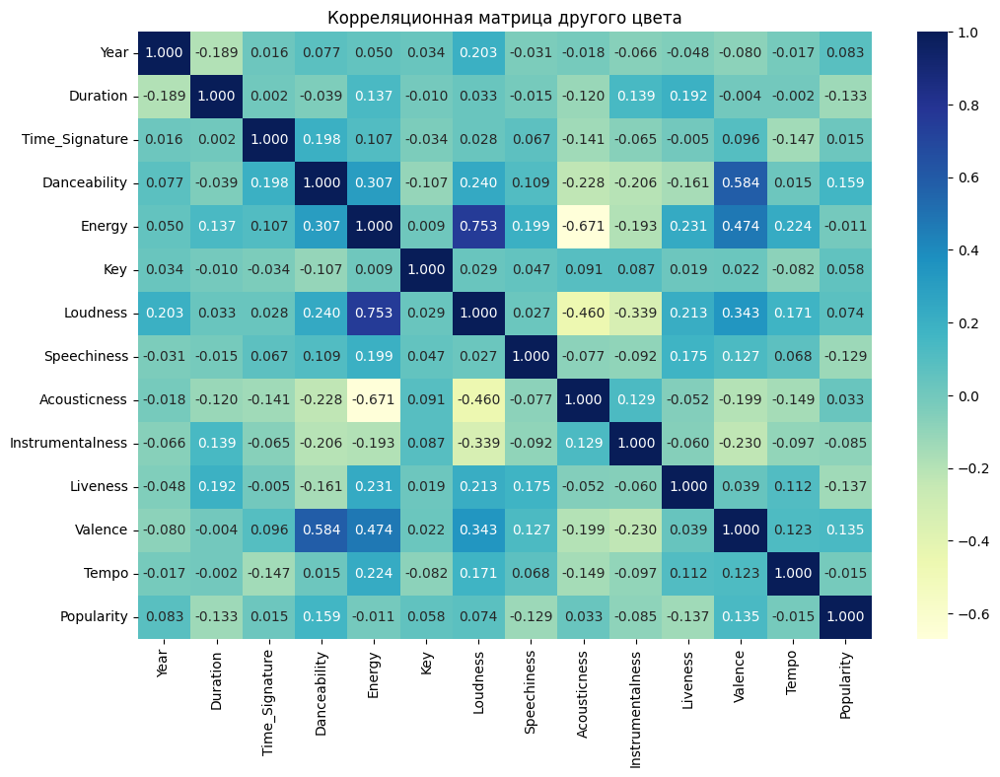

In [27]:
# Изменение цветовой гаммы
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True), cmap='YlGnBu', annot=True, fmt='.3f')
plt.title("Корреляционная матрица другого цвета")
plt.show()

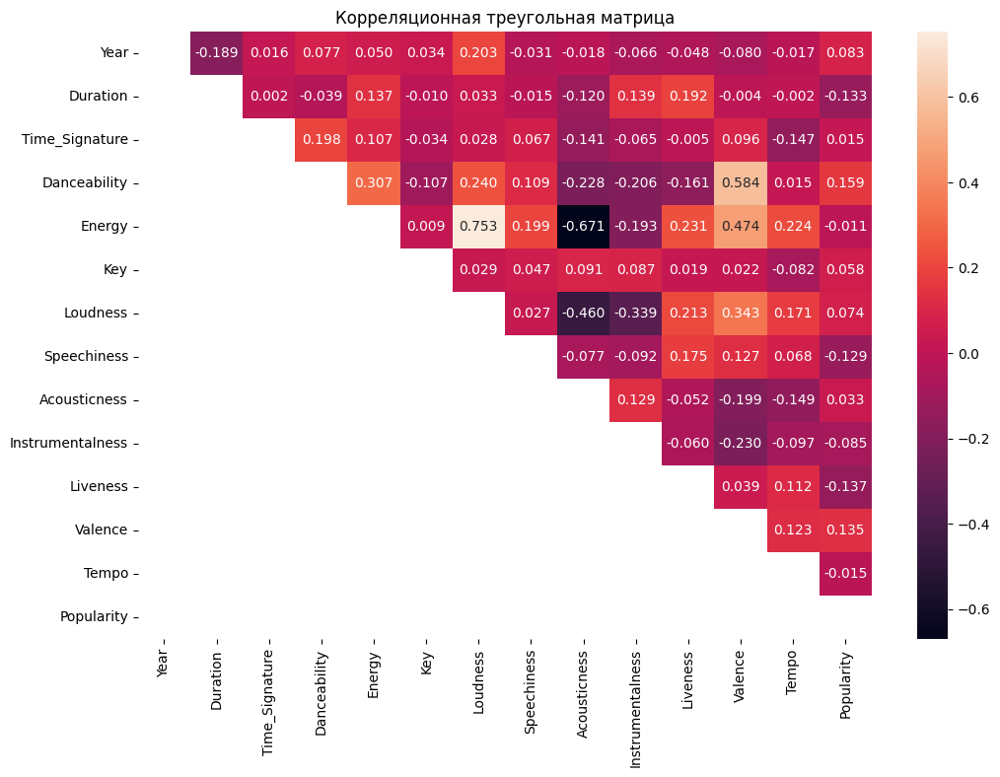

In [28]:
# Треугольный вариант матрицы
mask = np.zeros_like(df.corr(numeric_only=True), dtype=np.bool)
# чтобы оставить нижнюю часть матрицы
# mask[np.triu_indices_from(mask)] = True
# чтобы оставить верхнюю часть матрицы
plt.figure(figsize=(12, 8))
mask[np.tril_indices_from(mask)] = True
sns.heatmap(df.corr(numeric_only=True), mask=mask, annot=True, fmt='.3f')
plt.title("Корреляционная треугольная матрица")
plt.show()

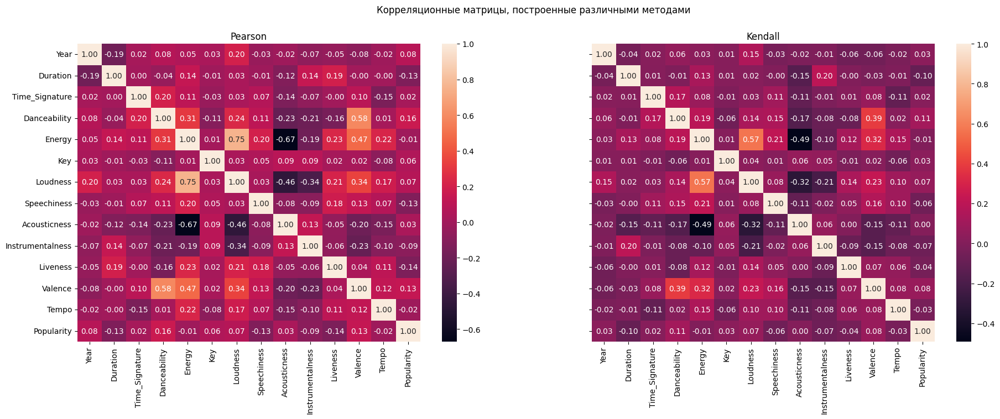

In [29]:
fig, ax = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(22,7))
sns.heatmap(df.corr(numeric_only=True, method='pearson'), ax=ax[0], annot=True, fmt='.2f')
sns.heatmap(df.corr(numeric_only=True, method='kendall'), ax=ax[1], annot=True, fmt='.2f')
fig.suptitle('Корреляционные матрицы, построенные различными методами')
ax[0].title.set_text('Pearson')
ax[1].title.set_text('Kendall')

# Дополнительные графики

### График линий и корреляционная матрица

Используем графики линий для визуализации изменения музыкальных характеристик (Energy, Danceability и т.д.) во времени, отображая зависимость от года выпуска трека. Для количественной оценки взаимосвязи между годом и характеристиками треков рассчитывается и выводится корреляционная матрица.

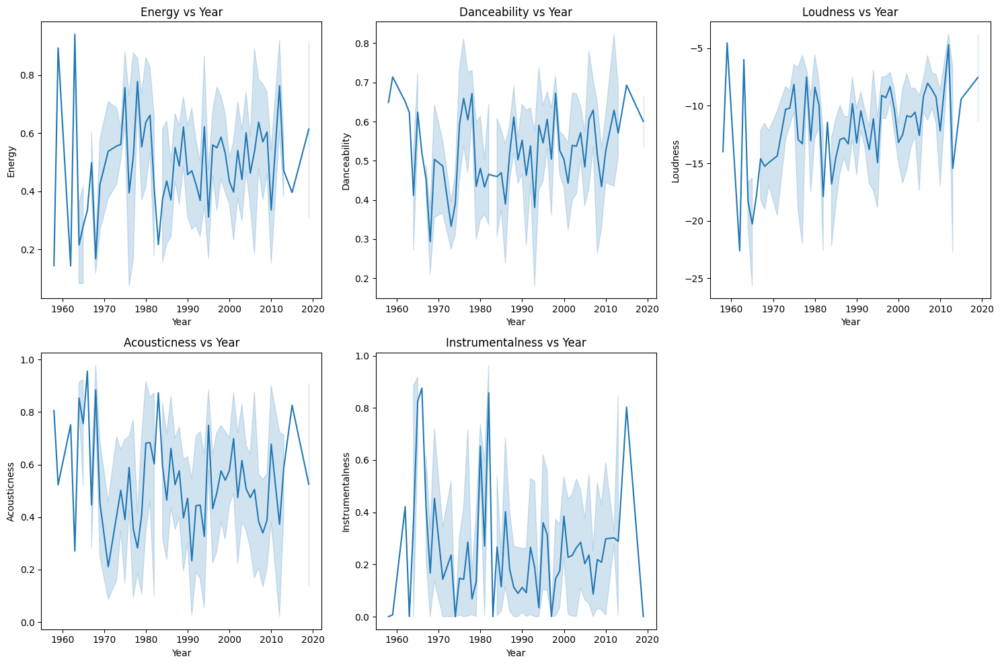

Корреляционная матрица между годом и характеристиками треков:
 Energy              0.049895
Danceability        0.076979
Loudness            0.202742
Acousticness       -0.017693
Instrumentalness   -0.065800
Name: Year, dtype: float64


In [30]:
features = ['Energy', 'Danceability', 'Loudness', 'Acousticness', 'Instrumentalness']

# Визуализация
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features, 1):
    plt.subplot(2, 3, i)
    sns.lineplot(x='Year', y=feature, data=df)
    plt.title(f'{feature} vs Year')
plt.tight_layout()
plt.show()

# Анализ корреляции
corr_matrix = df[['Year'] + features].corr(numeric_only=True)
print("Корреляционная матрица между годом и характеристиками треков:\n", corr_matrix['Year'].drop('Year'))


### Ящик с усами, t-статистика, средние значения 
Создадим два boxplot (ящик с усами). Один показывает распределение Valence для треков с режимом ‘minor’ и ‘major’. Другой показывает распределение Energy для треков с режимом ‘minor’ и ‘major’.
Проведем t-тест для сравнения средних значений Valence и Energy между треками с режимом ‘minor’ и ‘major’. Выведем t-статистику и p-значение.
Выведем средние значения valence и energy для треков с режимом ‘minor’ и ‘major’.

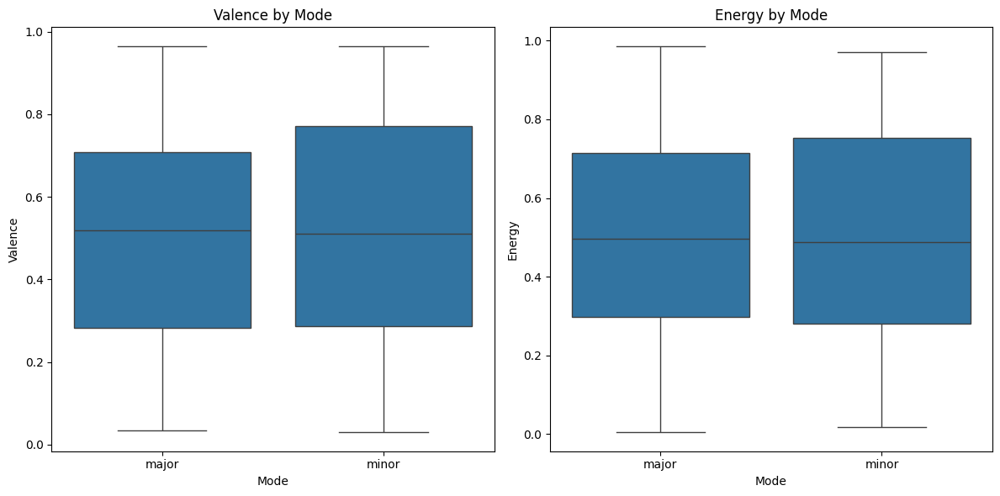

t-статистика и p-value для Valence: t=0.34, p=0.734
t-статистика и p-value для Energy: t=0.35, p=0.729

Средние значения valence и energy для минорных и мажорных треков:
         Valence    Energy
Mode                     
major  0.499635  0.498259
minor  0.510472  0.508670


In [31]:
# Визуализация
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x='Mode', y='Valence', data=df)
plt.title('Valence by Mode')
plt.subplot(1, 2, 2)
sns.boxplot(x='Mode', y='Energy', data=df)
plt.title('Energy by Mode')
plt.tight_layout()
plt.show()

# Статистический анализ
valence_minor = df[df['Mode'] == 'minor']['Valence']
valence_major = df[df['Mode'] == 'major']['Valence']
energy_minor = df[df['Mode'] == 'minor']['Energy']
energy_major = df[df['Mode'] == 'major']['Energy']

t_stat_valence, p_val_valence = stats.ttest_ind(valence_minor, valence_major, equal_var=False)
t_stat_energy, p_val_energy = stats.ttest_ind(energy_minor, energy_major, equal_var=False)

print(f"t-статистика и p-value для Valence: t={t_stat_valence:.2f}, p={p_val_valence:.3f}")
print(f"t-статистика и p-value для Energy: t={t_stat_energy:.2f}, p={p_val_energy:.3f}")


# Средние значения
mode_mean = df.groupby('Mode', observed=True)[['Valence', 'Energy']].mean()
print("\nСредние значения valence и energy для минорных и мажорных треков:\n", mode_mean)